# AST4310, Autumn 2020, Project 3
### Authored by 15907 & 15909

In [1]:
%%javascript  # Allow equation numbers
MathJax.Hub.Config({
    TeX: { equationNumbers: { autoNumber: "AMS" } }
});

MathJax.Hub.Queue(
  ["resetEquationNumbers", MathJax.InputJax.TeX],
  ["PreProcess", MathJax.Hub],
  ["Reprocess", MathJax.Hub]
);


<IPython.core.display.Javascript object>

Libraries that is used to analyze the dataset.

In [2]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from astropy import units
from astropy import constants
from astropy.table import QTable  # to use tables with units
from astropy.visualization import quantity_support
from IPython.display import set_matplotlib_formats
from matplotlib.animation import ArtistAnimation
from IPython.display import HTML
import time as t

quantity_support()
set_matplotlib_formats('svg')
plt.rc('legend', frameon=False)
plt.rc('figure', figsize=(10, 8)) # Larger figure sizes

## Introduction

Recent observations of the sun have revealed a peculiar phenomenom on its surface. Large dark spots have been detected by the Swedish 1-m Solar Telescope (SST). Observing the Fe I spectral line at 617.334 nm, we observed a region (umbra) with a significant drop in intensity. This umbra spanned approximately 5 Mm at the sun's surface, surrounded by a penumbra stretching almost 5 Mm further out.

Our goal is to extract as much information as possible from the data gained from SST. The data we are looking at is gained from the CRISP instrument in the telescope which produces datasets over a range of wavelengths. The dataset are five dimensional, that is in the x and y direction, a wavelength dimension and also in time and intensity/polarization. In this project we are mostly interested in analyzing the behavior of wavelengths at one frame in intensity. We will also look at the circular polarization (Stokes V) only to determine the magnetic field of the image. The dataset gained from SST is downloaded as a fits file and loaded using Python as the programming language of choise.

Dataset information:
- Location of observation: (x, y) = (-473'', 248'')
- Image resolution: (nx, ny) = (974, 961)
- One pixel width: 1 pixel = 0.058'' = 42.46 km (solar surface)
- Observation date: 7th august 2020
- Cover most of the Fe I 617 nm line
- 13 wavelengths that spans from 617.268 nm to 617.332 nm

In [3]:
data = QTable.read('SST_sunspot_617_2020.08.07.fits')
intensity = data['intensity']
wavelength = data['wavelength']
print("Shape of dataset: ", intensity.shape)
nx = len(intensity[0,0,:])
ny = len(intensity[0,:,0])

Shape of dataset:  (13, 961, 974)


First, we will visualise the spectral line over the region of the sun's surface we are looking at. In particular, we study two spectral lines in the umbra and the granulation. The granulation $-$ looking like cells $-$ is the dominant nature of the sun's surface.

In [4]:
xy_label = [0, 42.46*nx/1000, 42.46*ny/1000, 0]
fig, ax = plt.subplots(1,2,figsize=(12,6))
ims = []
I1 = intensity[:, 200, 200]/intensity[0, 200, 200]
I2 = intensity[:, 400, 550]/intensity[0, 400, 550]
ax[1].plot(wavelength, I1, label='Granulation', color="red")
ax[1].plot(wavelength, I2, label='Umbra', color="blue")

wl = wavelength.value

for i in range(len(wavelength)):
    image1 = ax[0].imshow(data['intensity'][i].value, vmax=4.6e-8, cmap='inferno', extent=xy_label)
    image2, = ax[1].plot(wl[i], I1[i], ".", ms=15, color="red")
    image3, = ax[1].plot(wl[i], I2[i], ".", ms=15, color="blue")
    ax[1].grid(); ax[1].legend()
    ims.append([image1, image2, image3])

anim = ArtistAnimation(fig, ims, interval=500, blit=True)
ax[0].set_xlabel("x [Mm]")
ax[0].set_ylabel("y [Mm]")
fig.tight_layout()
plt.close(fig)
HTML(anim.to_jshtml())

This animation shows how the intensity of Fe I varies with different wavelengths at the surface. The left plot shows the full field of view while the right plot shows the normalized spectral lines for one pixel in the granulation and the umbra. We can see major differences between the two spectral lines. In the umbra the spectral line is far broader, with pronounced line wings. In the granulation the spectral line is sharper, and more closely resembles a Gaussian profile. The steepness in the pixel covering the granulation indicates a great change in intensity per wavelength as it is not true in the umbra. This is seen from the animation on the left as the intensity gradient are more drastically at the granular region.

## Doppler velocity
An interesting subject would be to investigate Doppler shifts in the vicinity of the Sun's surface. This would give information about the flow of gas near the surface. We know the central wavelength of a spectral line by observation in a laboratory here on earth. With the observed central wavelength from the Sun, we may use these two parameters to calculate the region velocity on the surface by introducing the Doppler shift formula:

\begin{equation}
    \frac{\Delta \lambda}{\lambda_0} = \frac{v}{c}
    \label{eq:doppler_shift}
\end{equation}
where $\Delta \lambda = \lambda_0 - \lambda$ and $\lambda_0 = 617.300$ nm is the wavelength of Fe of I after subtracted the rotational velocity of the Sun while $\lambda$ is the observed wavelength. If we get negative values, we know that the region is moving away from us and vice versa. 

To find the doppler shift along the line of sight, we have to find the wavelength of the line center and insert this in equation \eqref{eq:doppler_shift}. Because we are limited by the resolution in wavelength, it is not immideately clear where the line center is. One way to solve this problem is to fit a Gaussian profile to the spectral lines, and finding the line center of this profile. Fitting a Gaussian to an absorption line presents certain difficulties, namely that an inverted Gaussian is numerically unstable. Therefore we subtract the observed intensity from the continuum intensity at the observed wavelength. In theory this implies that we treat the spectral lines as emission lines, but for all practical purposes it makes no difference. We fit the gaussian intensity profile 
\begin{equation}
    I(\lambda) = A \exp\left(-\frac{(\lambda-\mu)^2}{2\sigma^2}\right)\,,
    \label{eq:gaussian}
\end{equation}
with the parameters $A, \mu, \sigma$. We interpret $A$ as the strength of the line, $\mu$ as the line center, and $\sigma$ as the width of the line.

In [5]:
#Warning! Although it is not super slow, this cell is still time consuming Runtime: 600.39 s on my laptop.
#To save time, just load gauss_fit.npy (22 Mb). It should be included in the delivery.
from scipy.optimize import curve_fit

def gaussian(x, A, mu, sigma):
    return A*np.exp(-(x-mu)**2/(2.*sigma**2))

def line_profile():
    gauss_fit = np.zeros((ny, nx, 3))
    p0 = np.array((1e-8, 617.303, 1e-2))
    t0 = t.time()
    for j in range(ny*nx):
        y = j%ny
        x = j//ny
        gauss_fit[y, x],_ = curve_fit(gaussian, wavelength, (intensity[0,y,x] - intensity[:,y,x]), p0=p0)
    print("Processing: Done     Total run time: %.2f s" % (t.time()-t0))
    #The profiles are saved with:
    np.save("gauss_fit.npy", gauss_fit)
#line_profile()
gauss_fit = np.load("gauss_fit.npy")
A = gauss_fit[:,:,0]*units.W/units.Hz/units.m**2/units.sr
mu = gauss_fit[:,:,1]*units.nm
sigma = gauss_fit[:,:,2]*units.nm

After fitting the line profiles, we calculate the doppler velocity relative to our line of sight.

In [6]:
lambda_0=617.300*units.nm
def doppler_shift(wavelength, lambda_0=lambda_0):
    return (lambda_0-wavelength)/lambda_0*constants.c.to('km/s')
v_los = doppler_shift(mu)

Because we look at the sun at an inclination, we only observe the line of sight component of the velocity. To find the velocity perpendicular to the sun's surface we have to calculate
\begin{equation}
    v = \frac{v_{\textrm{los}}}{\cos \theta}\,.
    \label{eq:los}
\end{equation}
We find the angle $\theta$ by the inclination we observe at, and normalize by the angle spanned by the radius of the sun, i.e.
\begin{equation}
    \theta = \frac{\sqrt{\left(\theta_x^\textrm{obs}\right)^2 + \left(\theta_y^\textrm{obs}\right)^2}}{\theta^\textrm{sun}}\,.
\end{equation}
We find the angle as

In [7]:
x_angle = -473*units.arcsec
y_angle = 248*units.arcsec
theta_los = np.sqrt(x_angle**2 + y_angle**2)
theta_sun = 948*units.arcsec
theta = (theta_los/theta_sun).value
print("theta = %.3f" %theta)

theta = 0.563


Thus, we find the true doppler velocity, and plot it over the region we are looking at.

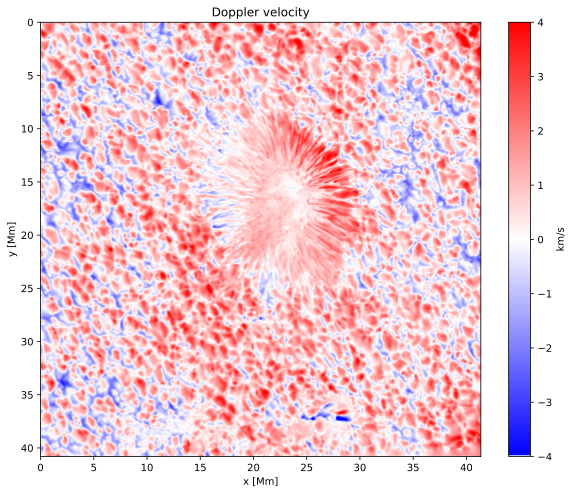

In [8]:
doppler_velocity = v_los/np.cos(theta)
fig, ax = plt.subplots(figsize=(10,8))
im = ax.imshow(doppler_velocity.value, vmin = -4, vmax = 4, cmap='bwr', extent=xy_label)
ax.set_title("Doppler velocity")
ax.set_xlabel("x [Mm]")
ax.set_ylabel("y [Mm]")
fig.colorbar(im).set_label("km/s");

The velocities in the granulation fluctuates between positive and negative velocities as seen from the figure above. This phenomenon is known as convection. Most of the granulation is moving in a positive direction, i.e. outwards from the surface of the Sun. It turns out that the magnitude of the velocity in the granules is less than the magnitude of the velocity in the inter-granular lanes. This way, the mass in the region is conserved. The velocity in the umbra is close to zero while the velocity in the penumbra is much greater and only positive. This imply that the velocity in the sunspot is greatest at the penumbra while there is almost no radiation transported to the surface of the Sun in the umbra. Notice that this is true only in the radial direction as we have no information about the horizontal velocity.

## Brightness temperature

Assuming that the Sun radiates as a black body and that we have observed the intensity for Fe I, we are able to calculate the brightness temperature of the Sun. This is done by introducing the Planck function:

\begin{equation}
    B_{\nu} (T_{\mathrm{b}}) = I_{\nu}^{\mathrm{obs}}
    \label{eq:planck_function}
\end{equation}
where $B_{\nu}$ is the Planck function, $T_{\mathrm{b}}$ is the brightness temperature and $I_{\nu}^{\mathrm{obs}}$ is the observed intensity around the Fe I spectral line. The Planck function is given as:

\begin{equation}
    B_{\nu}(T_{\mathrm{b}}) = \frac{2h\nu^3}{c^2} \frac{1}{e^{h\nu/k T_{\mathrm{b}}}-1} = I_{\nu}^{\mathrm{obs}}
    \label{eq:planck2}
\end{equation}

We must remember that this Planck function is given in units of [W sr$^{−1}$ m$^{-2}$ Hz$^{-1}$] meaning that we are considering the intensity per unit bandwidth. We know the relation between frequency and wavelength of some spectral line as:

\begin{equation}
    \nu = \frac{c}{\lambda}
\end{equation}
and will therefore use this definition in the Planck function to solve for $T_\mathrm{b}$. The brightness temperature is found by inverting the Planck function:

\begin{equation}
    T_{\mathrm{b}} = \frac{h\nu}{k} \frac{1}{\ln \left( \frac{2h\nu^3}{I_{\nu}^{\mathrm{obs}} c^2} + 1 \right)}
\end{equation}
Most of stellar objects seems to behave similar to a black body but some absorption lines are still present. This include the Fe I 617.3 line which means that we should rather use the continuum wavelength as they are more closely to the effective temperature of the star. The temperature will vary over the full field of view as the intensity varies. The brightness temperature is calculcated using the dataset that we have extracted from the SST in the code cell below.

Max/min temperature: 6710 / 4033 K


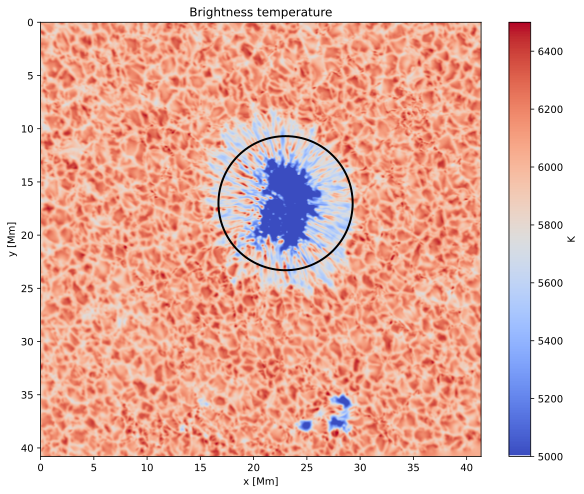

In [18]:
wl_b = wavelength[0]
nu_b = constants.c / wl_b
f1 = constants.h*nu_b / (constants.k_B)
f2 = (2*constants.h*nu_b**3) / (intensity[0,:,:]*constants.c**2)
T_b = (f1/np.log(f2/(units.sr) + 1)).to("K")
print("Max/min temperature: %i / %i K" % (np.max(T_b).value, np.min(T_b).value))

fig, ax = plt.subplots(figsize=(10,8))
im = ax.imshow(T_b.value, cmap='coolwarm', vmin=5000, vmax=6500, extent=xy_label)
circ = plt.Circle((23,17), 6.3, fill=False, color="black", lw=2)
ax.add_artist(circ)
ax.set_title("Brightness temperature")
ax.set_xlabel("x [Mm]")
ax.set_ylabel("y [Mm]")
fig.colorbar(im).set_label("K");

We observe a relatively big difference in temperature, not only between the dark umbra and the granulation, but also between the umbra and surrounding penumbra. Notice how the temperature between umbra and penumbra are quickly changing. With the assumption that the Sun radiates as a black body, most of the solar surface temperature lies in the range of 5800-6500 K. The temperature fluctuates over this interval in the granulation. Each granule seems to be seperated by cooler inter-granular lanes. 

The temperature in the umbra is approximately constant at only around 4000 K. The dark pores seen in the bottom of the image are also very cool. These pores do not have a penumbra around the dark regions as the sunspot have. We remember that we assumed the Sun to radiate as a black body which implies that the intensity of a specific wavelength can be directly related to the temperature from equation (2). Since the temperature is much lower at the umbra, the intensity must also be lower which results in the dark region in the plot. The velocity and the brightening temperature at the pores appears not to correlate with each other. We will blink the temperature and velocity plot to see if there are any correlation in the pores between these two parameters.

The plot above also gives an repsesentation of how big the sunspot really is. The black circle is the approximately size of the Earth with an radius of 6.3 Mm. We notice that the entire Earth fits inside the penumbra.

In [19]:
fig, ax = plt.subplots(1, 2, figsize=(15,8))
x1 = [530,720]
y1 = [800,950]
x2 = [500,700]
y2 = [300,500]

xy_corr1 = [xy_label[1]/nx*x1[0], xy_label[1]/nx*x1[1], xy_label[2]/nx*y1[1], xy_label[2]/nx*y1[0]]
xy_corr2 = [xy_label[1]/nx*x2[0], xy_label[1]/nx*x2[1], xy_label[2]/nx*y2[1], xy_label[2]/nx*y2[0]]

im1 = ax[0].imshow(T_b[y1[0]:y1[1], x1[0]:x1[1]].value, cmap='coolwarm', vmin=4500, vmax=6500, extent=xy_corr1)
im2 = ax[0].imshow(doppler_velocity[y1[0]:y1[1], x1[0]:x1[1]].value, vmin=-3, vmax=3,  cmap='bwr', extent=xy_corr1)
im3 = ax[1].imshow(T_b[y2[0]:y2[1], x2[0]:x2[1]].value, cmap='coolwarm', vmin=4500, vmax=6500, extent=xy_corr2)
im4 = ax[1].imshow(doppler_velocity[y2[0]:y2[1], x2[0]:x2[1]].value, vmin=-3, vmax=3,  cmap='bwr', extent=xy_corr2)
fig.colorbar(im1).set_label("K")
fig.colorbar(im2).set_label("km/s")

anim = ArtistAnimation(fig, [[im1, im3], [im2, im4]], interval=1000, blit=True)
fig.tight_layout()
plt.close(fig)
HTML(anim.to_jshtml())

At the left blink plot we have focused on the pores shown at the bottom in the previously plots above. The right blink plot is focused on the right side of the sunspot including both umbra and penumbra. It seems like the velocity is affected mostly in between and not directly at the pores. The velocity right at the pores is close to zero while the velocity between the two rightmost pores seems to be great in both positive and negative direction. It might look as there is some disturbance between the cool pores in terms of velocity. The velocity at the cooler regions is slighty positive but close to zero in both plots. The main difference between the pores and the sunspot is that the velocity in the penumbra is positive everywhere around the umbra. The vecolity around the pores are arbitrary but it might seem to be a correlation in between them.

If we blink the entire surface of the sun, we clearly see a correlation between brightness temperature and Doppler velocities in the granulation.

In [20]:
fig, ax = plt.subplots(figsize=(10,8))
im1 = ax.imshow(T_b.value, cmap='coolwarm', vmin=5000, vmax=6500, extent=xy_label)
im2 = ax.imshow(doppler_velocity.value, vmin=-3, vmax=3,  cmap='bwr', extent=xy_label)
fig.colorbar(im1).set_label("K")
fig.colorbar(im2).set_label("km/s")

anim = ArtistAnimation(fig, [[im1], [im2]], interval=1000, blit=True)
fig.tight_layout()
plt.close(fig)
HTML(anim.to_jshtml())

It can be seen from this animation that warm gas flows upwards in the granules. The gas cools down when it reaches the surface, and drops down in the inter-granular lanes.

## Thermal velocity
In stars, the thermal motions of particles are a main factor for broadening of spectral lines. This broadening is known as thermal broadening, and can be found from the standard deviation in the Gaussian profile of the spectral line, i.e.
\begin{equation}
    \frac{v_\textrm{Th}}{c} = \frac{\sigma}{\lambda_0}\,.
\end{equation}
Under the assumption that the only process in charge of the broadening of the spectral lines is the thermal velocities of the iron atoms, we can find the temperature directly from $\sigma$ as 
\begin{equation}
    v_\textrm{Th} = \sqrt{\frac{2kT}{m}} \quad \Leftrightarrow \quad T = \frac{m v_\textrm{Th}^2}{2 k_\textrm{B}}\,.
\end{equation}
Plotting the temperature from thermal motion gives us:

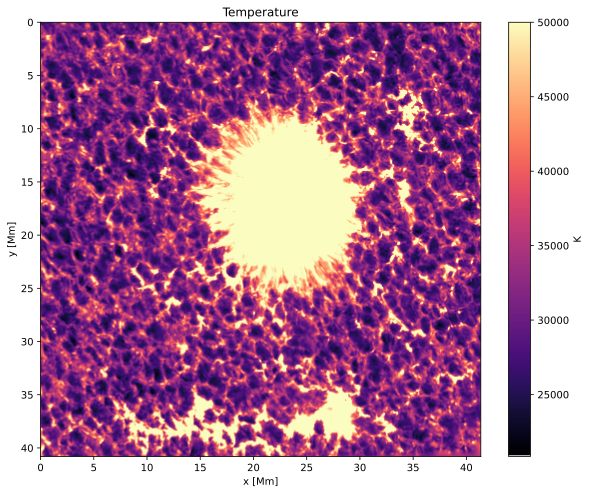

In [21]:
m_Fe = 55.845*units.Dalton
v_Th = sigma/lambda_0*constants.c
T = (m_Fe*v_Th**2/(2*constants.k_B)).to("K")
fig, ax = plt.subplots(figsize=(10,8))
im = ax.imshow(T.value, cmap='magma', vmax = 50000, extent=xy_label)
ax.set_title("Temperature")
ax.set_xlabel("x [Mm]")
ax.set_ylabel("y [Mm]")
fig.colorbar(im).set_label("K");

From this figure, we immideately observe that we have assumed wrongly. Firstly, the temperatures are too high. Secondly, the temperatures are higher in the inter-granular lanes than the granules. Therefore, there must be other factors broadening the spectral lines than thermal velocities. The largest temperature (and consequently broadening), is in the sunspot and pores. We will now investigate one reason for broadening of the spectral lines in these regions. 

## Magnetic field

As well as taking imagery of the intensity of emitted wavelengths, the circular polarization, Stokes V, of the same wavelengths are also possible to observe using the SST. With this type of data we are able to determine the magnetic field at the surface of the Sun but only at the line of sight of the observer.

Before we can calculate the magnetic field, we need to introduce the line width as a formula. There are multiple factors that affect the width of a spectral line from the solar surface. However, we will assume the Zeeman effect to be the dominant reason for the line broadening in the presence of strong magnetic fields. Thus the seperation would be given by:

\begin{equation}
    \Delta \lambda_{\mathrm{B}} = \frac{e}{4\pi m_e c} \lambda_0^2 B.
\end{equation}
where $e$ is the electron charge, $m_e$ is the electron mass, $\lambda_0$ is the rest wavelength and $B$ is the magnetic field. So we need to find $\Delta \lambda_{\mathrm{B}}$ by introducing the releation between cirlular polarization and spectral line broadening as follows:

\begin{equation}
    V_\lambda = - \Delta\lambda_B \bar{g} \cos\theta \frac{\partial I_\lambda}{\partial \lambda},
\end{equation}
where $\bar{g}$ is the Landé factor and $\theta$ is the angle between line of sight and the vector of the magnetic field. We have data of circular polarization and considering the fact that various wavelengths sensitivity is affected by instrumental noise, we get the expression for the magnetic field directed towards the observer as:

\begin{equation} 
    B_\mathrm{los} = -\frac{4 \pi m_e c}{e \bar{g} \lambda_0^2}\frac{\sum_\lambda \frac{\partial I}{\partial \lambda}
    V_\lambda}{\sum_\lambda\left(\frac{\partial I}{\partial \lambda}\right)^2}
\end{equation}

We find the derivative of intensity with respect to wavelength by taking the derivative of the Gaussian line profile that we introduced earlier. The derivative of the Gaussian fit is then:

\begin{equation}
   \frac{dI}{d\lambda} = -\frac{x-\mu}{\sigma^2} A \exp{\left( -\frac{(x-\mu)^2}{2\sigma^2} \right)}
\end{equation}
where $A$, $\mu$ and $\sigma$ is calculated when fitting the Doppler shift earlier. Keeping in mind that we inverted the line profiles, we have to work with the negative derivative, i.e.
$$
    \frac{dI}{d\lambda} \rightarrow - \frac{dI}{d\lambda}\,.
$$

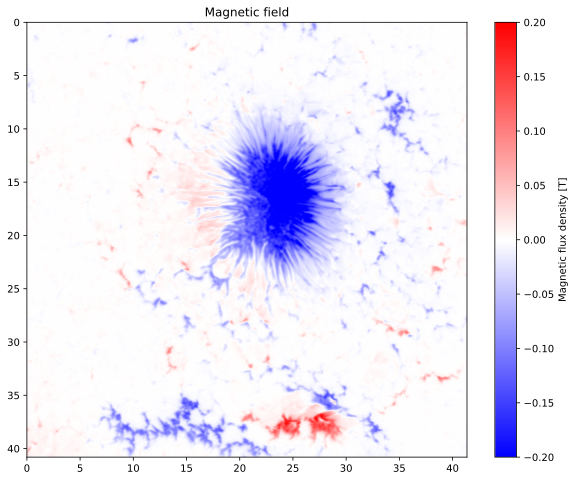

In [22]:
def gauss_derivative(x, A, mu, sigma):
    return -(x - mu)/sigma**2*gaussian(x, A, mu, sigma)

stoke_v = data["stokes_v"]
g_bar = 2.499
const = 4*np.pi*constants.m_e*constants.c/(constants.e.decompose()*g_bar*lambda_0**2)

def B_los(dI_dlambda, V):
    return const*np.sum(dI_dlambda*V, axis=0)/np.sum(dI_dlambda**2, axis=0)

dI_dlambda = -gauss_derivative(wavelength[:,np.newaxis, np.newaxis], A, mu, sigma)
B_line_of_sight = B_los(dI_dlambda, stoke_v).to("T")

fig, ax = plt.subplots(figsize=(10,8))
ax.set_title("Magnetic field")
im = ax.imshow(B_line_of_sight.value, cmap='bwr', vmin=-0.2, vmax=0.2, extent=xy_label)

fig.colorbar(im).set_label("Magnetic flux density [T]");

The magnetic field is strong within the sunspot compared to the granulation as seen above. Looking at the bar on the right indicates that the magnetic field at the sunspot lies around -0.20 T compared to the magnetic field at the surface of the Earth which is approximately 0.5 mT. The magnetic field in the umbra and penumbra is directed inwards, i.e. away from the observer. The net magnetic field is always balanced which means that the region containing the positive magnetic flux density is not shown in the image present. Nevertheless, the regions at the bottom of the plot may seem to correlate with eachother. We may imagine magnetic field stretching from the red pores into the blue regions at the bottom of the figure as closed loops.

## Conclusion

During the analysis in this project, we have seen that there is a lot happening within a sunspot in terms of intensities, velocities and magnetic fields. We started by calculating the Doppler shift velocity by performing a Gaussian fit on the observed intensity. The velocities near the surface of the sun indicated convection patterns. Warm gas flowed towards the surface and formed bubble patterns. At the edges of these bubbles, gas cooled at the surface flowed downwards towards stellar interior. Even though we were only able to measure the magnetic field density towards the observer, it is safe to assume that the field was oriented perpendicular to the solar surface. 

Throghout this data analysis, we were missing information in the magnetic field plot in terms of conservation of net magnetic field density. The dataset from the SST contains only information about the magnetic field of this particular sunspot and the surroundings in the granula. It is clear that the net magnetic field density from the field of view is negative (towards center of the Sun). One should investigate a larger field of view to determine whether the field spreads out evenly in the Sun or if it is correlated to another sunspot that is magnetically inverted. Since we can only find the magnetic field at the line of sight, we may not estimate the horizontal direction of the field. This may be a problem if we observe a number of sunspots and want to correlate them.